In [2]:
import datetime
from coursework import distance, daterange, new_kmeans, Mean, pca
import json
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pylab
from mpl_toolkits.mplot3d import axes3d

In [4]:
with open('clusters_timeline','r') as file:
    clusters_all = json.load(file)
with open('centres_timeline','r') as file:
    centroids_all = json.load(file)

In [5]:
clusters = clusters_all[0] # extracting cluster_0 data for the whole year
centroids = centroids_all[0] # centroid_0 values for the whole year

In [15]:
# choosing optimal semi-axes for ellipsoids
def get_semi(clusters, centroids):
    
    num_clust = len(clusters)
    semi = []
    for i in range(num_clust):
        semi.append([])
    for j in range(num_clust):
        for index, coord in enumerate(np.array(clusters[j]).T):
            # semi-axes are calculated as standard deviation of the coordinates
            semi[j].append(np.sqrt(sum((coord - centroids[j][index])**2)/len(coord)))

    # choosing optimal semis
    semis = []
    for j in range(num_clust):
        semis.append([])

    for i in range(num_clust):
        
        semis[i] = np.array(semi[i])
        m = len(clusters[i])
        counter = 0
        percent = counter / m
        omega = 1.01

        while percent < 0.95:

            for point in clusters[i]:

                if sum((np.array(point)-np.array(centroids[i]))**2 / (semis[i])**2) < 1:
                    counter += 1

            percent = counter / m
            counter = 0
            semis[i] *= omega
            
            
    print(f'{round(percent*100, 2)}% of the points are in the ellipsoid')
    
    return semis

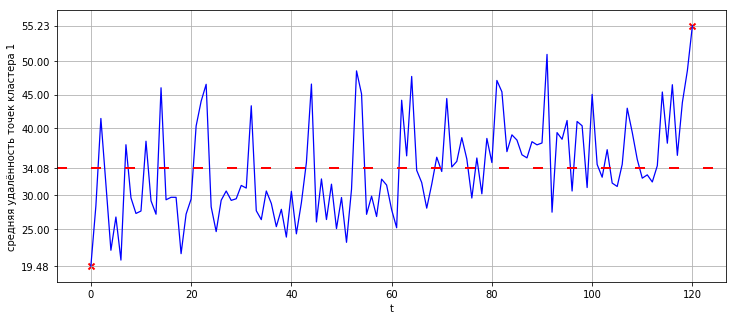

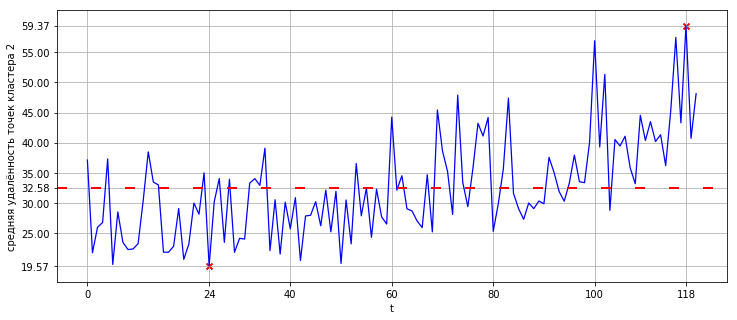

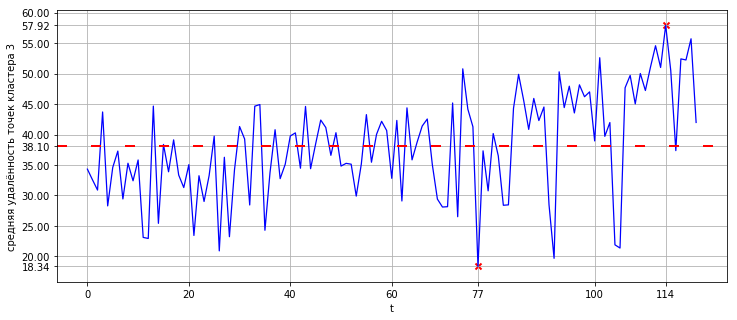

In [11]:
cluster_list = [0,1,2]
for i in cluster_list:
    elem_remoteness = []
    cluster_power = list(map(lambda x: len(x), clusters_all[i]))
    
    for cluster, centroid in zip(clusters_all[i], centroids_all[i]):
        elem_remoteness.append(sum([distance(centroid, elem) for elem in cluster])/len(cluster))
      
    #plot 
    min_point = np.min(elem_remoteness)
    max_point = np.max(elem_remoteness)
    mean = np.mean(elem_remoteness)
    argmin = np.argmin(elem_remoteness)
    argmax = np.argmax(elem_remoteness)
    
    plt.figure(figsize=(12,5))
    plt.plot(elem_remoteness, color='b', linewidth=1.25)
    plt.grid()
    
    new_xticks = list(plt.xticks()[0])
    new_yticks = list(plt.yticks()[0])
    
    crit_points = np.array([min_point, mean, max_point])
    crit_indices = np.array([argmin, argmax])
    
    for tick in new_yticks.copy():
        if (abs(tick - crit_points) < 1).any():
            new_yticks.remove(tick)
    for tick in new_xticks.copy():
        if (abs(tick - crit_indices) < 10).any():
            new_xticks.remove(tick)
        
    new_yticks = new_yticks + [mean, min_point, max_point]
    new_xticks = new_xticks + [argmin, argmax]
    
    plt.axhline(mean, color='r', linestyle='--', dashes=(5, 12), linewidth=2) # mean
    new_yticks.sort()
    plt.yticks(new_yticks) # adding extra ticks for max, min, mean 
    plt.xticks(new_xticks) # adding extra ticks for max, min 
    plt.scatter([argmin, argmax], [min_point, max_point], color='r', marker='x', linewidth=2) # max & min
    plt.xlabel('t')
    plt.ylabel(f'средняя удалённость точек кластера {i+1}')
    plt.pause(0.05)

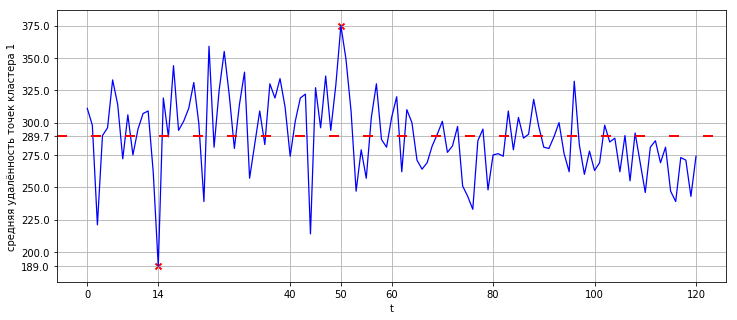

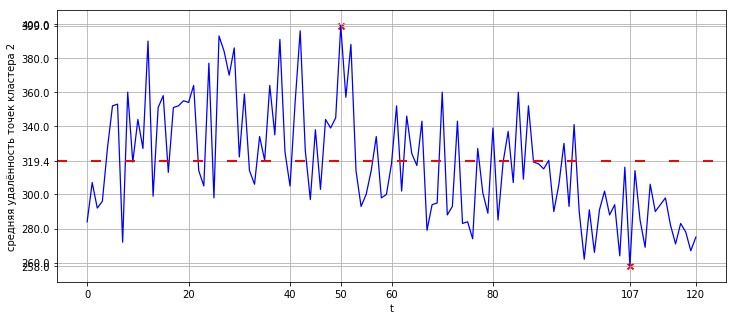

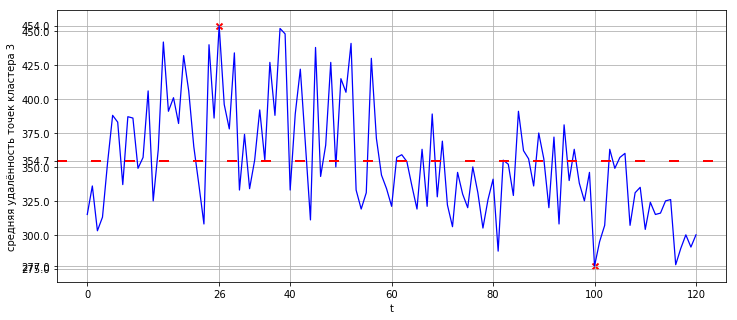

In [12]:
cluster_list = [0,1,2]
for i in cluster_list:
    
    cluster_power = list(map(lambda x: len(x), clusters_all[i]))
     
    #plot 
    min_point = np.min(cluster_power)
    max_point = np.max(cluster_power)
    mean = np.mean(cluster_power)
    argmin = np.argmin(cluster_power)
    argmax = np.argmax(cluster_power)
    
    plt.figure(figsize=(12,5))
    plt.plot(cluster_power, color='b', linewidth=1.25)
    plt.grid()
    
    new_xticks = list(plt.xticks()[0])
    new_yticks = list(plt.yticks()[0])
    
    crit_points = np.array([min_point, mean, max_point])
    crit_indices = np.array([argmin, argmax])
    
    for tick in new_yticks.copy():
        if (abs(tick - crit_points) < 1).any():
            new_yticks.remove(tick)
    for tick in new_xticks.copy():
        if (abs(tick - crit_indices) < 10).any():
            new_xticks.remove(tick)
        
    new_yticks = new_yticks + [mean, min_point, max_point]
    new_xticks = new_xticks + [argmin, argmax]
    
    plt.axhline(mean, color='r', linestyle='--', dashes=(5, 12), linewidth=2) # mean
    new_yticks.sort()
    plt.yticks(new_yticks) # adding extra ticks for max, min, mean 
    plt.xticks(new_xticks) # adding extra ticks for max, min 
    plt.scatter([argmin, argmax], [min_point, max_point], color='r', marker='x', linewidth=2) # max & min
    plt.xlabel('t')
    plt.ylabel(f'средняя удалённость точек кластера {i+1}')
    plt.pause(0.05)

In [44]:
def X_cubed(x):
    
    X = np.array([np.array(x)**0] + [np.array(x)**1] + [np.array(x)**2] + [np.array(x)**3]).T
    
    return X

In [45]:
def X_squared(x):
    
    X = np.array([np.array(x)**0] + [np.array(x)**1] + [np.array(x)**2]).T

    return X

In [46]:
def X(x):
    
    X = np.array([np.array(x)**0] + [np.array(x)**1]).T

    return X

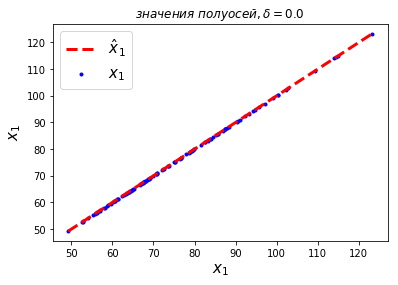

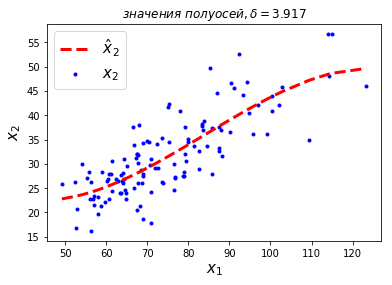

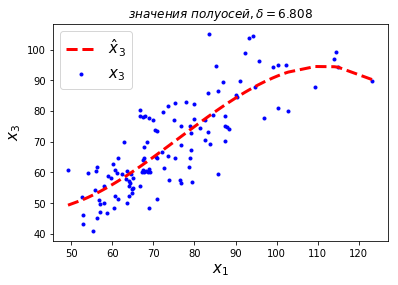

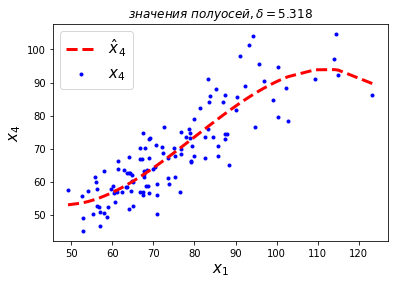

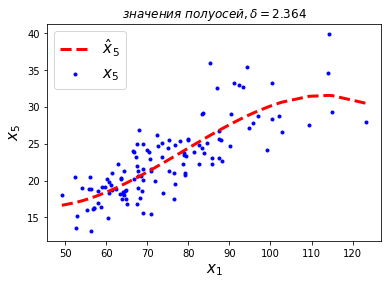

...

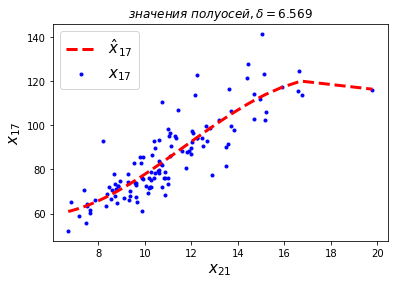

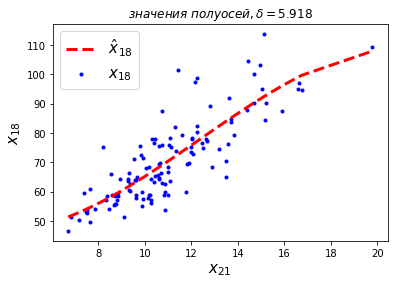

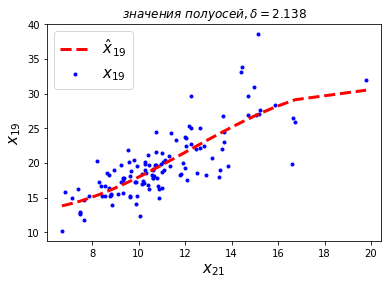

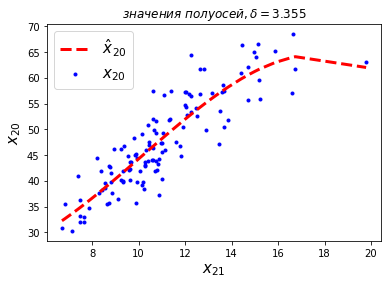

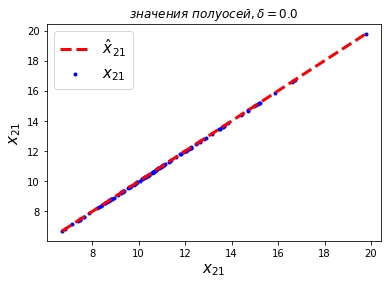

In [48]:
y_list_ = []
n = 21
for i in range(n):
    y_list_.append([])
for j in range(n):
    for i in range(n):
        
        y = np.array(semis).T[i]
        x = np.array(semis).T[j]

        X_ = X_cubed(x)
        w = (np.linalg.inv(X_.T.dot(X_)).dot(X_.T)).dot(y.T)
        y_ = X_.dot(w)
        y_list_[j].append(y_.tolist())
        e = np.mean(abs(y - y_))

        right_indices = np.argsort(x)
        plt.scatter(x, y, marker='.', color='b', label=f'$x_{{{i+1}}}$')
        plt.plot(x[right_indices], y_[right_indices], 'r--', linewidth=3, label=f'$\hatx_{{{i+1}}}$')

        plt.title(f'$значения\;полуосей, \delta = {round(e,3)}$')
        plt.xlabel(f'$x_{{{j+1}}}$', fontsize=15)
        plt.ylabel(f'$x_{{{i+1}}}$', fontsize=15)
        plt.legend(prop={'size':15})
        plt.pause(0.01)


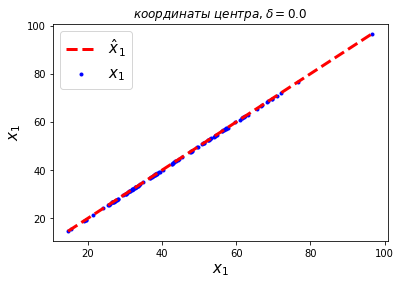

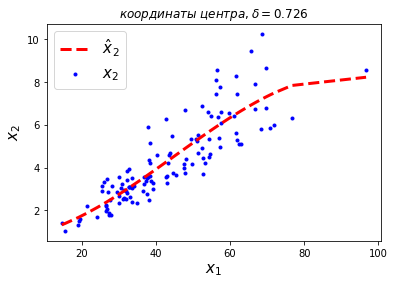

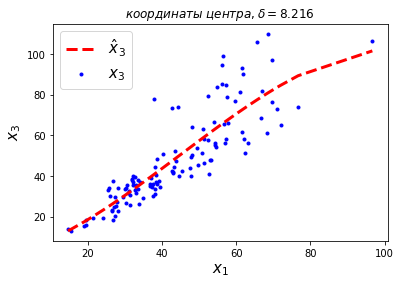

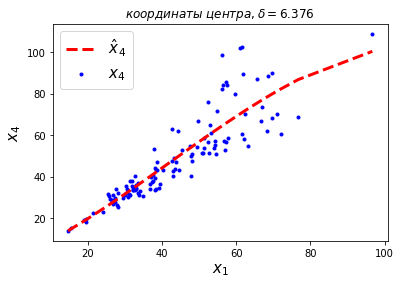

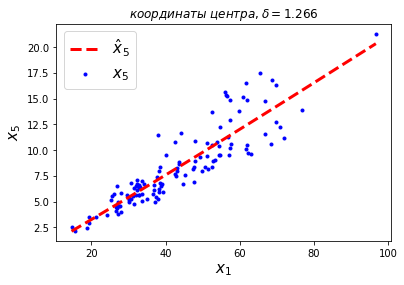

...

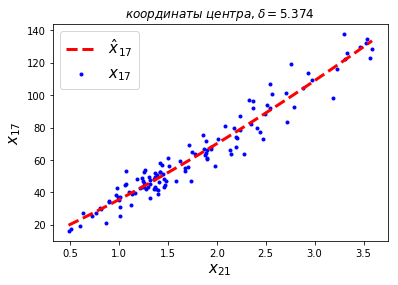

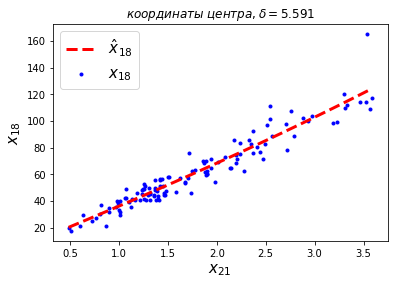

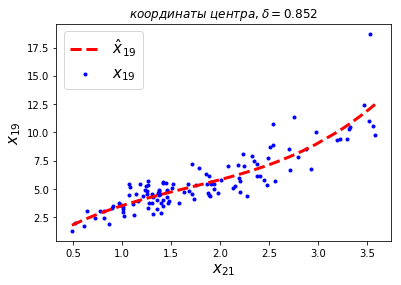

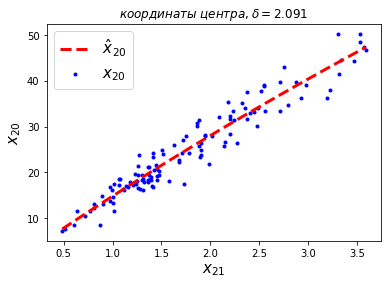

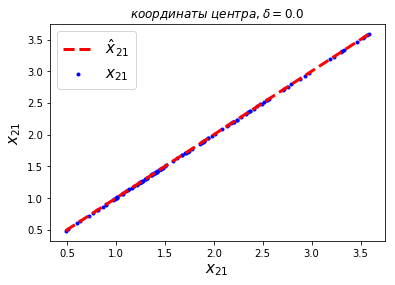

In [80]:
centres_time = np.array(centroids_all[0])
# j - independent variable
# i - dependent
centres_ = []
for i in range(n):
    centres_.append([])

for j in range(0, n):

    for i in range(0, n):
        x = centres_time.T[j][0:121]

        y = centres_time.T[i][0:121]

        counter = 0

        X_ = X_cubed(x)
        w = (np.linalg.inv(X_.T.dot(X_)).dot(X_.T)).dot(y.T)
        y_ = X_.dot(w)
        e = np.mean(abs(y_ - y))
        centres_[j].append(y_.tolist())

        right_indices = np.argsort(x)

        plt.scatter(x, y, marker='.', color='b', label = f'$x_{{{i+1}}}$')

        plt.plot(x[right_indices], y_[right_indices], 'r--', linewidth=3, label=f'$\hatx_{{{i+1}}}$')
        plt.title(f'$координаты\;центра, \delta = {round(e,3)}$')
        plt.xlabel(f'$x_{{{j+1}}}$', fontsize=15)
        plt.ylabel(f'$x_{{{i+1}}}$', fontsize=15)
        plt.legend(prop={'size':15})
        plt.pause(0.01)
    

In [85]:
avg_error(centres_, centres_time)

[array([6.39413591e-12, 7.26026542e-01, 8.21581386e+00, 6.37637447e+00,
        1.26596982e+00, 2.26847691e+00, 2.08145636e+00, 5.84153942e+00,
        1.83936261e+00, 6.04090745e-01, 1.93488821e+00, 8.80743952e+00,
        2.77646534e+00, 1.36204313e+00, 2.69844114e-01, 1.23408701e+00,
        1.04989247e+01, 7.80499166e+00, 1.02602872e+00, 2.92632044e+00,
        2.71549676e-01]),
 array([5.31845154e+00, 2.51877490e-13, 3.36916816e+00, 5.65700767e+00,
        6.83646588e-01, 1.64125103e+00, 1.18168293e+00, 3.05286701e+00,
        1.00191192e+00, 5.14603070e-01, 2.28394948e+00, 6.23720236e+00,
        1.30290540e+00, 7.98880838e-01, 1.83797271e-01, 6.39131115e-01,
        4.70594926e+00, 4.87749634e+00, 7.40707112e-01, 1.65393291e+00,
        1.90815098e-01]),
 array([5.07942739e+00, 2.92922631e-01, 1.21430579e-11, 4.89681097e+00,
        4.54289408e-01, 1.37020241e+00, 7.47145998e-01, 2.45427208e+00,
        4.99349780e-01, 4.81499344e-01, 2.25954379e+00, 4.93497711e+00,
        6.27

In [83]:
def avg_error(y_list_, old_semi):
    
    new_semi = []
    for k in range(n):
        new_semi.append([])
        new_semi[k] = np.zeros((n,121))

    for l in range(n):    
        for i in range(n):
            for j in range(121):
                new_semi[l][i][j] = y_list_[l][i][j]
        new_semi[l] = new_semi[l].T
    
    error_means = []
    semis = old_semi
    for i in range(n):
        error_means.append(Mean(abs(new_semi[i] - semis)))
        
    return error_means

In [74]:
connections = []
for j in range(21):
    connections.append([])
    
for i in range(21):
    for j in range(21):
        if avg_error(y_list_, semis)[i][j] < 2 and not i == j:
            connections[i].append(j)

In [75]:
for i in range(21):
    print(f'{i}:{np.array(connections[i])}')

0:[ 9 20]
1:[ 4  9 15 18 20]
2:[ 4  8  9 14 15 18 20]
3:[ 4  9 15 18 20]
4:[ 8  9 14 15 18 20]
5:[ 4  8  9 14 15 18 20]
6:[ 4  8  9 13 15 18 20]
7:[ 4  8  9 14 15 18 20]
8:[ 4  9 14 15 18 20]
9:[ 4 18 20]
10:[20]
11:[ 9 18 20]
12:[ 4  6  8  9 13 14 15 18 20]
13:[ 4  8  9 14 15 18 20]
14:[ 9 20]
15:[ 4  8  9 18 20]
16:[ 4  8  9 14 15 18 20]
17:[ 4  8  9 18 20]
18:[ 4  9 20]
19:[ 4  8  9 14 15 18 20]
20:[4 9]


In [193]:
semi_p = [new_semi[0][0][0]] + [new_semi[0][0][9]] + [new_semi[0][0][20]]
semi_r = [semis[0][0]] + [semis[0][9]] + [semis[0][20]]

In [194]:
cent_p = [15.475, 0.4545, 0.5370]
cent_r = [15.475, 0.3826, 0.4855]

In [196]:
distance(cent_p, cent_r)
# np.array(semi_p) - np.array(semi_r)

0.0884412799545552

In [184]:
semis_3d = [semi_p] + [semi_r]
centres_3d = [cent_p] + [cent_r]

<IPython.core.display.Javascript object>


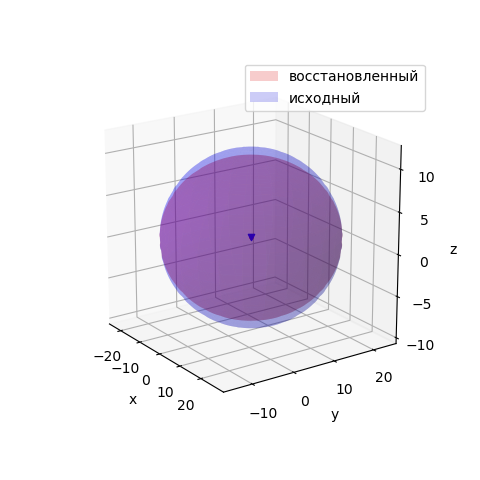

In [188]:
%matplotlib notebook

num_clust = 2
fig = plt.figure(figsize=plt.figaspect(1))  # Square figure
ax = fig.add_subplot(111, projection='3d')
colors = [(1,0,0, 0.2),(0,0,1, 0.2),(0.1,0.8,0.5, 0.5),(0.8,0.5,0.5, 0.5),(0.1,0.3,0.1, 0.5),(0.7,0.3,0.1, 0.5)]
labels = ['восстановленный', 'исходный']

rx, ry, rz = np.zeros(num_clust), np.zeros(num_clust), np.zeros(num_clust)
x, y, z = [],[],[]
    
u = np.linspace(0, 2 * np.pi, 100)
v = np.linspace(0, np.pi, 100)

for i in range(num_clust):
    rx[i], ry[i], rz[i] = semis_3d[i]
    x.append(rx[i] * np.outer(np.cos(u), np.sin(v)) + centres_3d[i][0])
    y.append(ry[i] * np.outer(np.sin(u), np.sin(v)) + centres_3d[i][1])
    z.append(rz[i] * np.outer(np.ones_like(u), np.cos(v)) + centres_3d[i][2])

    
    surf = ax.plot_surface(x[i], y[i], z[i],  rstride=4, cstride=4, color=colors[i], label=labels[i])
    ax.scatter(centres_3d[i][0],centres_3d[i][1],centres_3d[i][2], color = ['red', 'blue'][i], marker=['.','v'][i])
    surf._facecolors2d=surf._facecolors3d
    surf._edgecolors2d=surf._edgecolors3d
    
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.legend()


plt.show()